<a href="https://colab.research.google.com/github/diegofdogonzalez/repositorio1-/blob/master/Clase5_Fil.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
from google.colab import drive
drive.mount('/content/drive')




Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
# importar librerias necesarias 

import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

path='/content/drive/My Drive/colab/images/'
os.chdir(path)
!pwd

# graficar imagenes estaticas en el notebook
%matplotlib inline



/content/drive/My Drive/colab/images


In [0]:
def displayGray3(a, b,c,title1 = "Original", title2 = "Edited", title3 = "Edited"):
    plt.figure(figsize=(20,20))
    plt.subplot(131), plt.imshow(a,cmap='gray'), plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(132), plt.imshow(b,cmap='gray'), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.subplot(133), plt.imshow(c,cmap='gray'), plt.title(title3)
    plt.xticks([]), plt.yticks([])
    plt.show()
    
def displayHist3(a, b,c,title1 = "Original", title2 = "Edited", title3 = "Edited"):
    plt.figure(figsize=(18,5))
    plt.subplot(231), plt.plot(a, color='gray')
    plt.xlabel('intensidad de iluminacion')
    plt.ylabel('cantidad de pixeles')
    
    plt.subplot(232), plt.plot(b, color='gray')
    plt.xlabel('intensidad de iluminacion')
    plt.ylabel('cantidad de pixeles')
    
    plt.subplot(233), plt.plot(c, color='gray')
    plt.xlabel('intensidad de iluminacion')
    plt.ylabel('cantidad de pixeles')
    plt.show()
    
def displayGray4(a, b, c, d, title1 = "Original", title2 = "Edited", title3 = "Edited", title4 = "Edited"):
    plt.figure(figsize=(30,30))
    plt.subplot(141), plt.imshow(a,cmap='gray'), plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(142), plt.imshow(b,cmap='gray'), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.subplot(143), plt.imshow(c,cmap='gray'), plt.title(title3)
    plt.xticks([]), plt.yticks([])
    plt.subplot(144), plt.imshow(d,cmap='gray'), plt.title(title4)
    plt.xticks([]), plt.yticks([])
    plt.show()
    
def displayGray2(a, b,title1 = "Original", title2 = "Edited"):
    plt.figure(figsize=(30,30))
    plt.subplot(121), plt.imshow(a,cmap='gray'), plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(b,cmap='gray'), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.show()
    
def displayColor3(a, b,c,title1 = "Original", title2 = "Edited", title3 = "Edited"):
    plt.figure(figsize=(10,10))
    plt.subplot(131), plt.imshow(a), plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(132), plt.imshow(b), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.subplot(133), plt.imshow(c), plt.title(title3)
    plt.xticks([]), plt.yticks([])
    plt.show()
    
def displayColor2(a, b,title1 = "Original", title2 = "Edited"):
    plt.figure(figsize=(25,25))
    plt.subplot(131), plt.imshow(a), plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(132), plt.imshow(b), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.show()
    
def displayColor4(a, b, c, d, title1 = "Original", title2 = "Edited"):
    plt.figure(figsize=(10,10))
    plt.subplot(131), plt.imshow(a), plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(132), plt.imshow(b), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.subplot(133), plt.imshow(c), plt.title(title3)
    plt.xticks([]), plt.yticks([])
    plt.subplot(134), plt.imshow(d), plt.title(title4)
    plt.xticks([]), plt.yticks([])
    plt.show()

def readRGB(imgPath):
    img = cv2.imread(imgPath)
    img =cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    return img

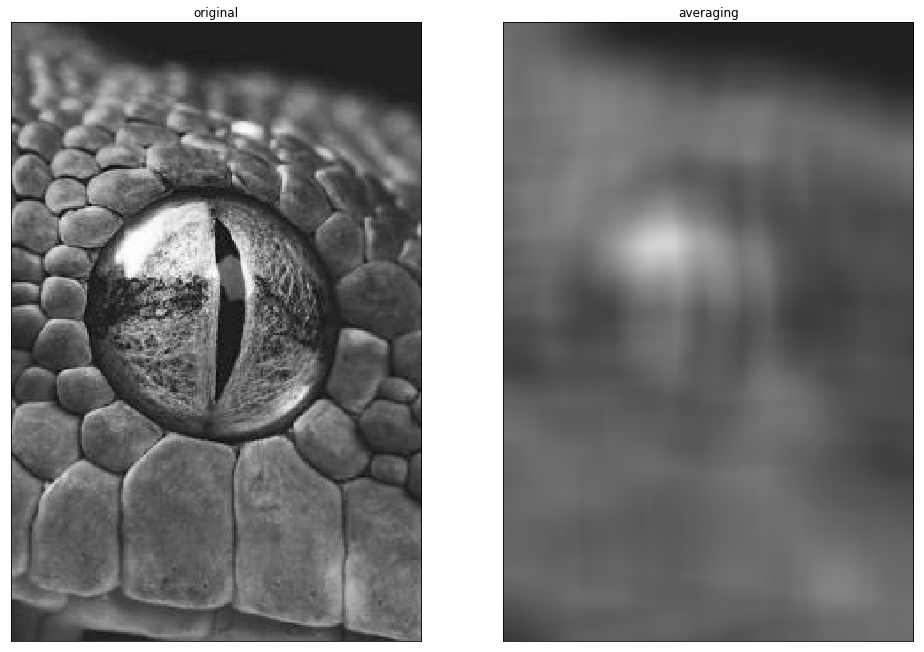

In [0]:
img = cv2.imread('ojo.jpg')

kernel = np.ones((37,37),np.float32)/1369
dst = cv2.filter2D(img,-1,kernel)

displayColor2(img,dst,"original","averaging")

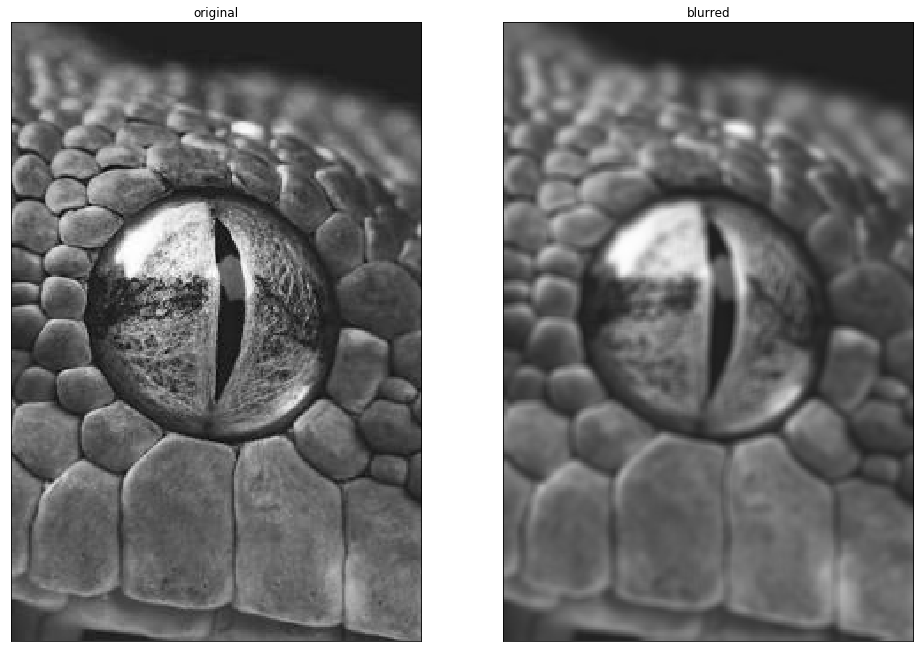

In [0]:
img = cv2.imread('ojo.jpg')
blur = cv2.blur(img,(5,5))
displayColor2(img,blur,"original","blurred")

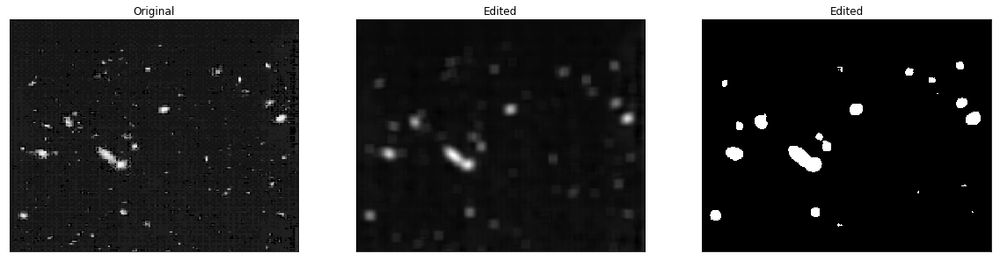

In [0]:


#isplayColor2(img_manchas,blur,"original","blurred","Umbralización")

def Threshold(img,thres):
    #Cargar imagen
    img = cv2.imread(img, cv2.IMREAD_GRAYSCALE)
    rows, columns = img.shape
    blur = cv2.blur(img,(15,15))
    img2 = np.zeros( (rows, columns), dtype = np.uint8)
    
    #intervalos
    T = thres
    
    for x in range(0,rows):
        for y in range(0,columns):
            r = blur[x][y]
            if T<=r:
                img2[x][y] = 255
            else:
                img2[x][y] = 0
    displayGray3(img, blur,img2)
    return
Threshold('manchas.png.PNG',50)

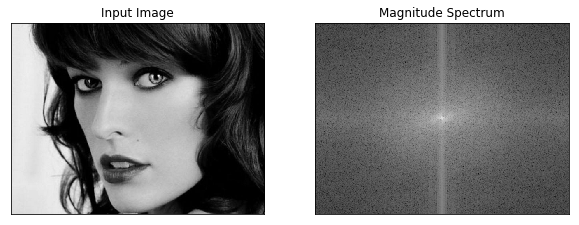

In [0]:
img = cv2.imread('resid.png',0)
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))


displayGray2(img,magnitude_spectrum,"Input Image","Magnitude Spectrum")

# **Espectro de frecuencia**

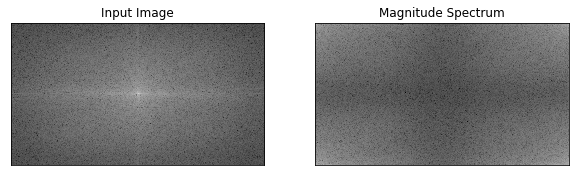

In [0]:
img = cv2.imread('kid.jpg',0)
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum_c = 20*np.log(np.abs(fshift))
magnitude_spectrum_ori = 20*np.log(np.abs(f))

displayGray2(magnitude_spectrum_c,magnitude_spectrum_ori,"Input Image","Magnitude Spectrum")


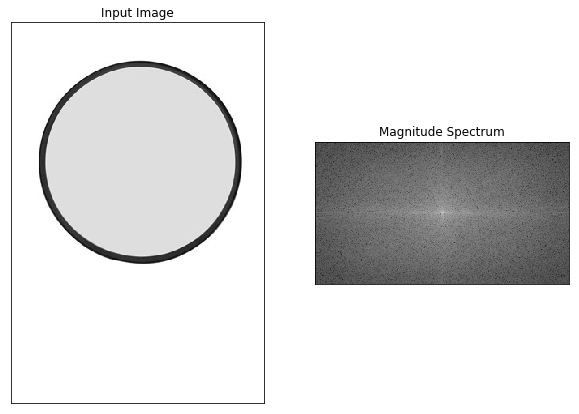

In [0]:
img_cir = cv2.imread('circulo.jpg',0)
f = np.fft.fft2(img_cir)
fshift1 = np.fft.fftshift(f)
magnitude_spectrum_c = 20*np.log(np.abs(fshift))
#magnitude_spectrum_ori = 20*np.log(np.abs(f))

displayGray2(img_cir,magnitude_spectrum_c,"Input Image","Magnitude Spectrum")


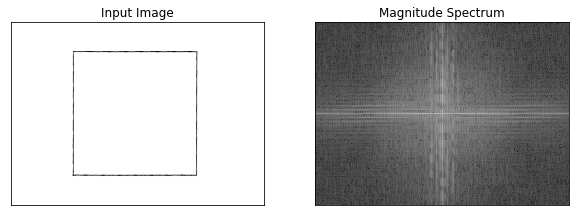

In [0]:
img_cua = cv2.imread('cuadrado.jpg',0)
f = np.fft.fft2(img_cua)
fshift = np.fft.fftshift(f)
magnitude_spectrum_cu = 20*np.log(np.abs(fshift))
#magnitude_spectrum_ori = 20*np.log(np.abs(f))

displayGray2(img_cua,magnitude_spectrum_cu,"Input Image","Magnitude Spectrum")

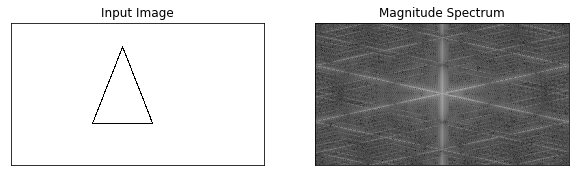

In [0]:
img_tri = cv2.imread('triangulo.jpg',0)
f = np.fft.fft2(img_tri)
fshift = np.fft.fftshift(f)
magnitude_spectrum_t = 20*np.log(np.abs(fshift))
#magnitude_spectrum_ori = 20*np.log(np.abs(f))

displayGray2(img_tri,magnitude_spectrum_t,"Input Image","Magnitude Spectrum")

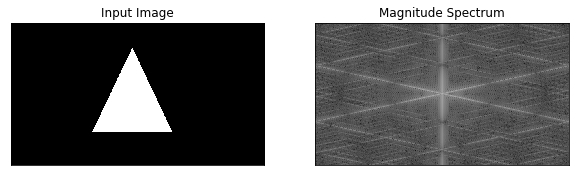

In [0]:
img_triN = cv2.imread('trianguloNegro.jpg',0)
f = np.fft.fft2(img_triN)
fshift4 = np.fft.fftshift(f)
magnitude_spectrum_c = 20*np.log(np.abs(fshift))
#magnitude_spectrum_ori = 20*np.log(np.abs(f))

displayGray2(img_triN,magnitude_spectrum_c,"Input Image","Magnitude Spectrum")

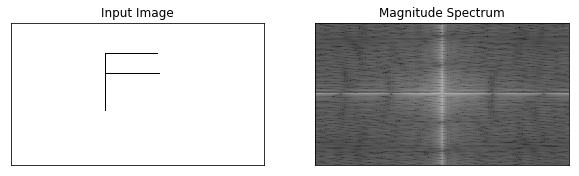

In [0]:
img_F = cv2.imread('F.jpg',0)
f = np.fft.fft2(img_F)
fshift = np.fft.fftshift(f)
magnitude_spectrum_c = 20*np.log(np.abs(fshift))
#magnitude_spectrum_ori = 20*np.log(np.abs(f))

displayGray2(img_F,magnitude_spectrum_c,"Input Image","Magnitude Spectrum")

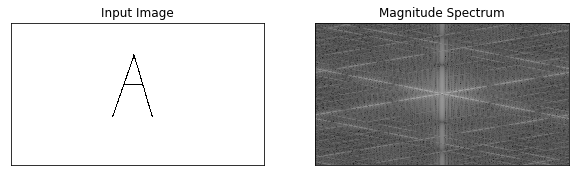

In [0]:
img_A = cv2.imread('Caicer.jpg',0)
f = np.fft.fft2(img_A)
fshift = np.fft.fftshift(f)
magnitude_spectrum_c = 20*np.log(np.abs(fshift))
#magnitude_spectrum_ori = 20*np.log(np.abs(f))

displayGray2(img_A,magnitude_spectrum_c,"Input Image","Magnitude Spectrum")

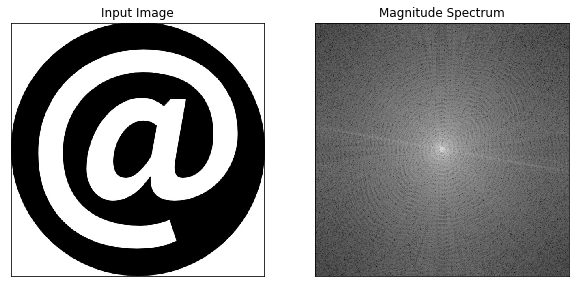

In [0]:
img_arro= cv2.imread('@.jpg',0)
f = np.fft.fft2(img_arro)
fshift = np.fft.fftshift(f)
magnitude_spectrum_c = 20*np.log(np.abs(fshift))
#magnitude_spectrum_ori = 20*np.log(np.abs(f))

displayGray2(img_arro,magnitude_spectrum_c,"Input Image","Magnitude Spectrum")

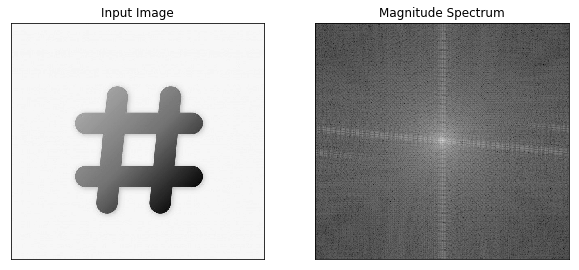

In [0]:
img_hashtag= cv2.imread('#.jpg',0)
f = np.fft.fft2(img_hashtag)
fshift = np.fft.fftshift(f)
magnitude_spectrum_c = 20*np.log(np.abs(fshift))
#magnitude_spectrum_ori = 20*np.log(np.abs(f))

displayGray2(img_hashtag,magnitude_spectrum_c,"Input Image","Magnitude Spectrum")

# **Pasa Bajos**

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in log
  


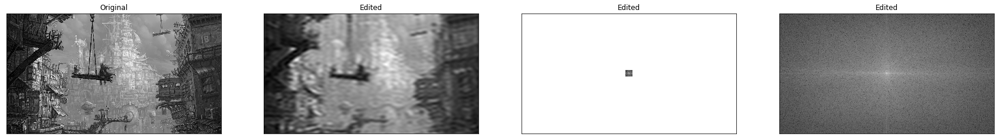

In [0]:
img_flotante = np.float32(img)
dft = cv2.dft(img_flotante,flags = cv2.DFT_COMPLEX_OUTPUT)
dft_shift=np.fft.fftshift(dft)
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))
fils, cols = img.shape
centfils, centcols = fils/2, cols/2

##creemos una mascara con un centro cuadrado de 1 y el resto zeros
mask = np.zeros((fils,cols,2), np.uint8)
mask[np.int32(centfils)-30:np.int32(centfils)+30, np.int32(centcols)-30:np.int32(centcols)+30]=1

##Aplicamos la mascara y luego obtenemos la inversa DFT
fshift = dft_shift*mask
fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:,:,0], img_back[:,:,1])

displayGray4(img,img_back,fshift_mask_mag,magnitude_spectrum)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in log
  


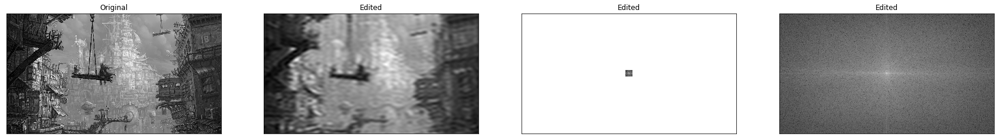

In [0]:
img_flotante = np.float32(img)
dft = cv2.dft(img_flotante,flags = cv2.DFT_COMPLEX_OUTPUT)
dft_shift=np.fft.fftshift(dft)
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))
fils, cols = img.shape
centfils, centcols = fils/2, cols/2

##creemos una mascara con un centro cuadrado de 1 y el resto zeros
mask = np.zeros((fils,cols,2), np.uint8)
mask[np.int32(centfils)-30:np.int32(centfils)+30, np.int32(centcols)-30:np.int32(centcols)+30]=1

##Aplicamos la mascara y luego obtenemos la inversa DFT
fshift = dft_shift*mask
fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:,:,0], img_back[:,:,1])

displayGray4(img,img_back,fshift_mask_mag,magnitude_spectrum)

# **Pasa Altos**

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in log
  


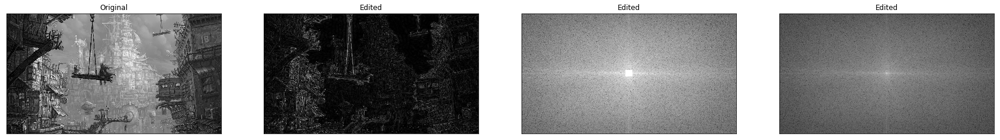

In [0]:
img_flotante = np.float32(img)
dft = cv2.dft(img_flotante,flags = cv2.DFT_COMPLEX_OUTPUT)
dft_shift=np.fft.fftshift(dft)
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))
fils, cols = img.shape
centfils, centcols = fils/2, cols/2

##creemos una mascara con un centro cuadrado de 1 y el resto zeros
mask = np.ones((fils,cols,2), np.uint8)
mask[np.int32(centfils)-30:np.int32(centfils)+30, np.int32(centcols)-30:np.int32(centcols)+30]=0

##Aplicamos la mascara y luego obtenemos la inversa DFT
fshift = dft_shift*mask
fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:,:,0], img_back[:,:,1])

displayGray4(img,img_back,fshift_mask_mag,magnitude_spectrum)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log
  from ipykernel import kernelapp as app


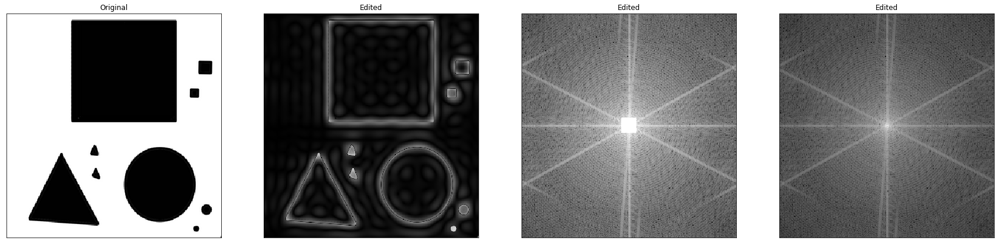

In [0]:
img_fig = cv2.imread('figuras.png',0)
img_flotante = np.float32(img_fig)
dft = cv2.dft(img_flotante,flags = cv2.DFT_COMPLEX_OUTPUT)
dft_shift=np.fft.fftshift(dft)
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))
fils, cols = img_fig.shape
centfils, centcols = fils/2, cols/2

##creemos una mascara con un centro cuadrado de 1 y el resto zeros
mask = np.ones((fils,cols,2), np.uint8)
mask[np.int32(centfils)-10:np.int32(centfils)+10, np.int32(centcols)-10:np.int32(centcols)+10]=0

##Aplicamos la mascara y luego obtenemos la inversa DFT
fshift = dft_shift*mask
fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:,:,0], img_back[:,:,1])

displayGray4(img_fig,img_back,fshift_mask_mag,magnitude_spectrum)

# Pasa altos kernel **redondo**

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in log


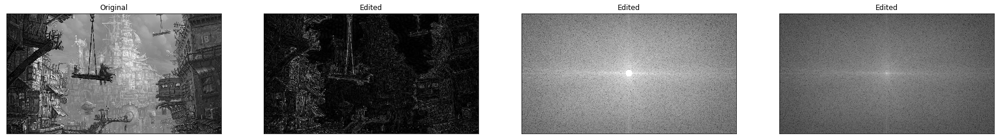

In [0]:
img_flotante = np.float32(img)
dft = cv2.dft(img_flotante,flags = cv2.DFT_COMPLEX_OUTPUT)
dft_shift=np.fft.fftshift(dft)
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))
fils, cols = img.shape
centfils, centcols = fils/2, cols/2

##creemos una mascara con un centro cuadrado de 1 y el resto zeros
mask = np.ones((fils,cols,2), np.uint8)
r = 30
center = [centfils, centcols]
x, y = np.ogrid[:fils, :cols]

mask = np.ones((fils,cols,2), np.uint8)
mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
mask[mask_area] = 0

##Aplicamos la mascara y luego obtenemos la inversa DFT
fshift = dft_shift*mask
fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:,:,0], img_back[:,:,1])

displayGray4(img,img_back,fshift_mask_mag,magnitude_spectrum)

# **Pasa bajos kernel redondo**


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in log


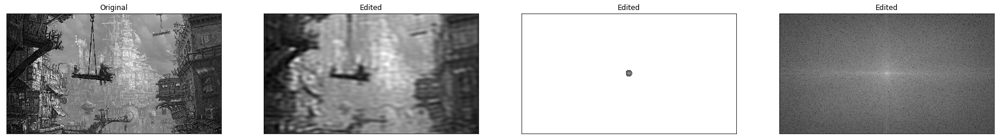

In [0]:
img_flotante = np.float32(img)
dft = cv2.dft(img_flotante,flags = cv2.DFT_COMPLEX_OUTPUT)
dft_shift=np.fft.fftshift(dft)
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))
fils, cols = img.shape
centfils, centcols = fils/2, cols/2

##creemos una mascara con un centro cuadrado de 1 y el resto zeros
mask = np.zeros((fils,cols,2), np.uint8)
r = 30
center = [centfils, centcols]
x, y = np.ogrid[:fils, :cols]

mask = np.zeros((fils,cols,2), np.uint8)
mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
mask[mask_area] = 1

##Aplicamos la mascara y luego obtenemos la inversa DFT
fshift = dft_shift*mask
fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:,:,0], img_back[:,:,1])

displayGray4(img,img_back,fshift_mask_mag,magnitude_spectrum)

# **Filtro mediana / para quitar ruido**

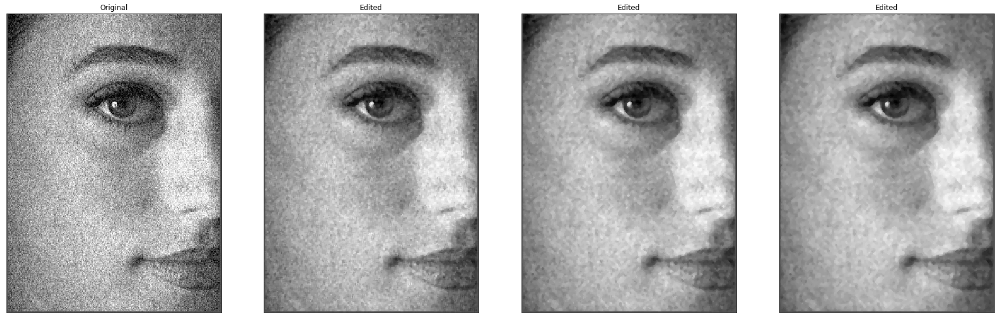

In [0]:
#read the imagen papito
img = cv2.imread("ruidoOoOo.jpg",0)
#apply the 3x3=9 median filter on the image
median = cv2.medianBlur(img, 3)
mediann = cv2.medianBlur(median,3)
mediannn = cv2.medianBlur(mediann,3)
#display image

displayGray4(img,median,mediann,mediannn)

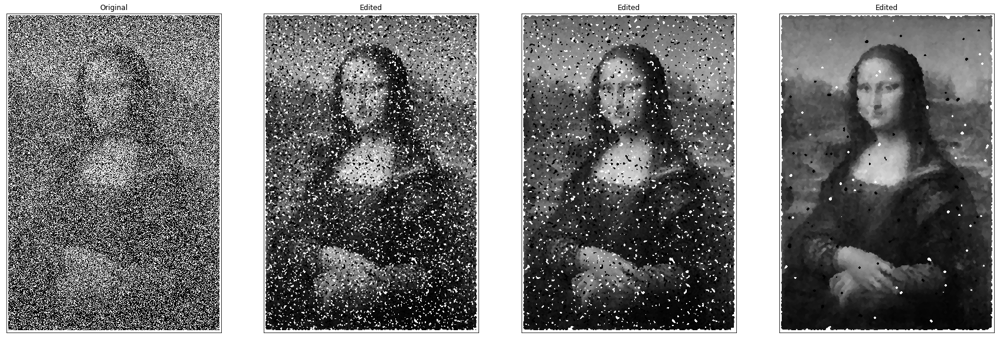

In [0]:
#read the imagen papito
img1 = cv2.imread("monalisa.png",0)
#apply the 3x3=9 median filter on the image
medianuno = cv2.medianBlur(img1, 3)
mediandos = cv2.medianBlur(medianuno,3)
mediantres = cv2.medianBlur(mediandos,3)
mediancuatro = cv2.medianBlur(mediantres, 3)
mediancinco = cv2.medianBlur(mediancuatro,3)
medianseis = cv2.medianBlur(mediancinco,3)
mediansiete = cv2.medianBlur(medianseis,3)
medianocho = cv2.medianBlur(mediansiete,3)
mediannueve = cv2.medianBlur(medianocho,3)
mediandiez = cv2.medianBlur(mediannueve,3)

#display image

displayGray4(img1,medianuno,mediandos,mediandiez)


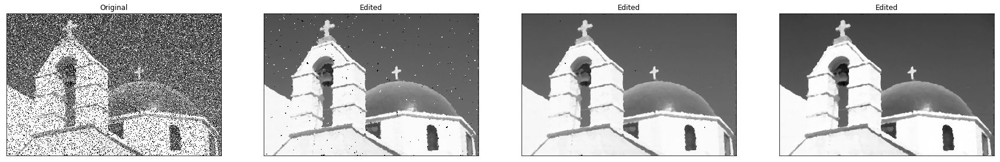

In [0]:
#read the imagen papito
img2 = cv2.imread("iglesia.png",0)
#apply the 3x3=9 median filter on the image
median1 = cv2.medianBlur(img2, 3)
median2 = cv2.medianBlur(median1,3)
median3 = cv2.medianBlur(median2,3)

#display image

displayGray4(img2,median1,median2,median3)

# **GaussianBlur**

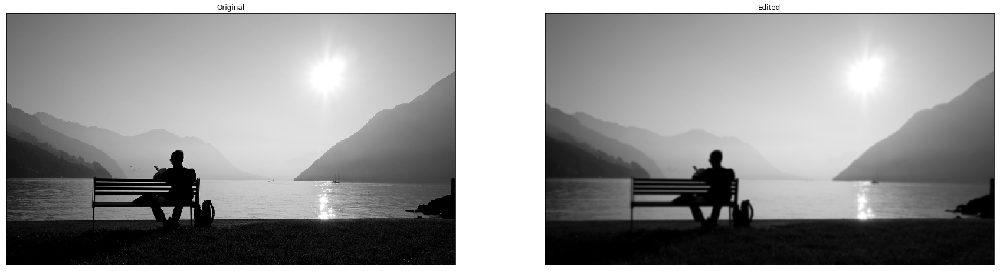

In [0]:
#read the imagen papito
img = cv2.imread("iwanttocry.jpg",0)
#apply the 3x3 median filter on the image
gauss = cv2.GaussianBlur(img,(9,9),0)

#display image
displayGray2(img,gauss)

# **Bilateral Filter**

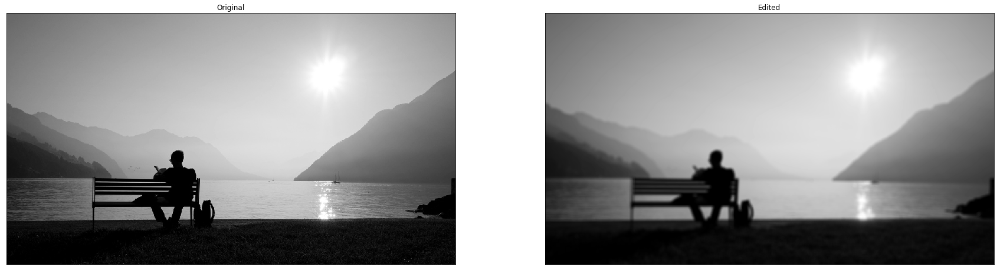

In [0]:
#read the imagen papito
img = cv2.imread("iwanttocry.jpg",0)
#apply the 3x3 median filter on the image
bilateral = cv2.bilateralFilter(img,10,300,300)

#display image
displayGray2(img,bilateral)

# **4 laplacinao filters**

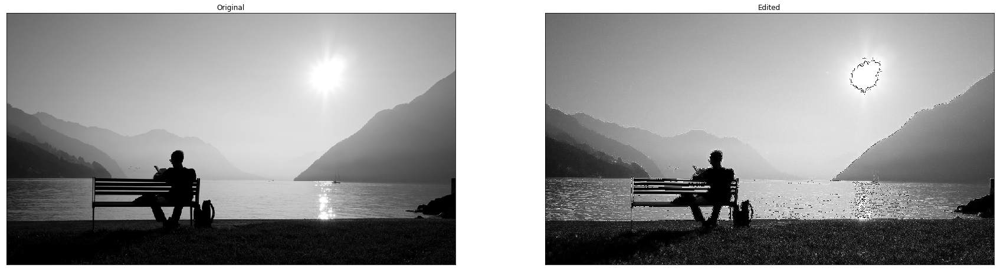

In [0]:
#read the imagen papito
img = cv2.imread("iwanttocry.jpg",0)

kernel = np.array([[0,-1,0],[-1,4,-1],[0,-1,0]],np.float32)
kernel2 = np.array([[0,1,0],[1,-4,1],[0,1,0]],np.float32)
kernel3 = np.array([[1,1,1],[1,-8,1],[1,1,1]],np.float32)
kernel4 = np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]],np.float32)

dst = cv2.filter2D(img,-1,kernel3)

dst =  dst + img







#display image
displayGray2(img,dst)

# **Derivative Filters**

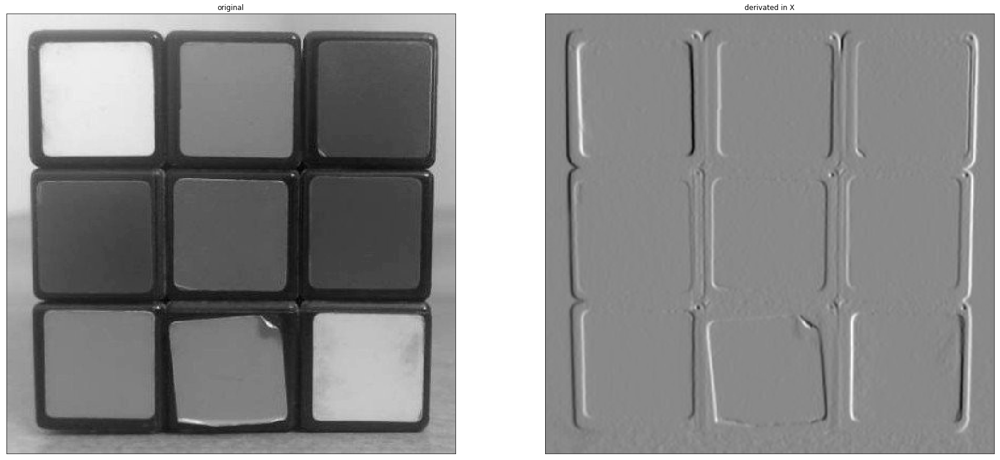

In [0]:
img = cv2.imread('rub07.jpg',0)
x_sobel = cv2.Sobel(img, cv2.CV_64F,1,0,ksize=5)

displayGray2(img, x_sobel, "original", "derivated in X")

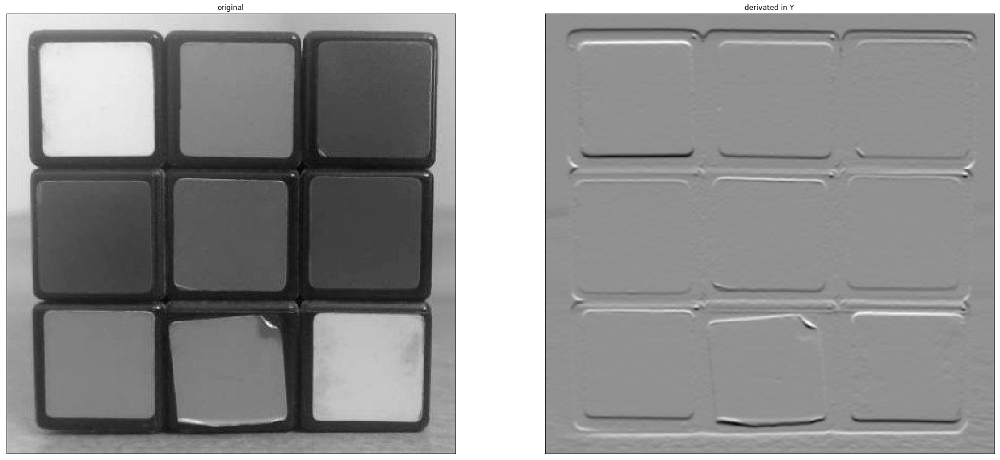

In [0]:
img = cv2.imread('rub07.jpg',0)
y_sobel = cv2.Sobel(img, cv2.CV_64F,0,1,ksize=5)

displayGray2(img, y_sobel, "original", "derivated in Y")

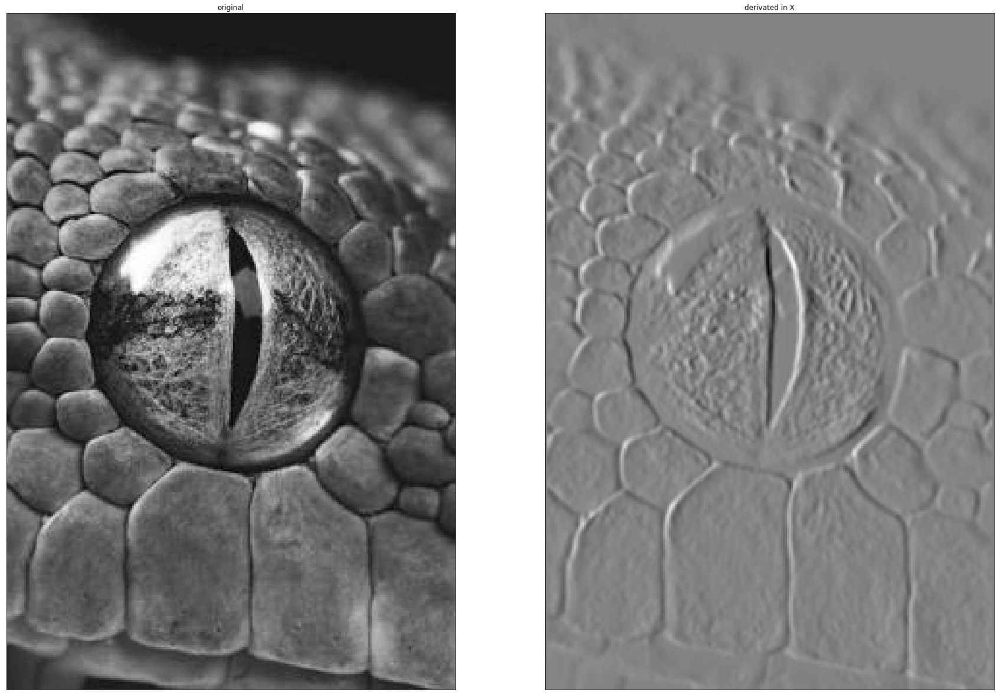

In [0]:
img = cv2.imread('ojo.jpg',0)
x_sobel = cv2.Sobel(img, cv2.CV_64F,1,0,ksize=5)

displayGray2(img, x_sobel, "original", "derivated in X")

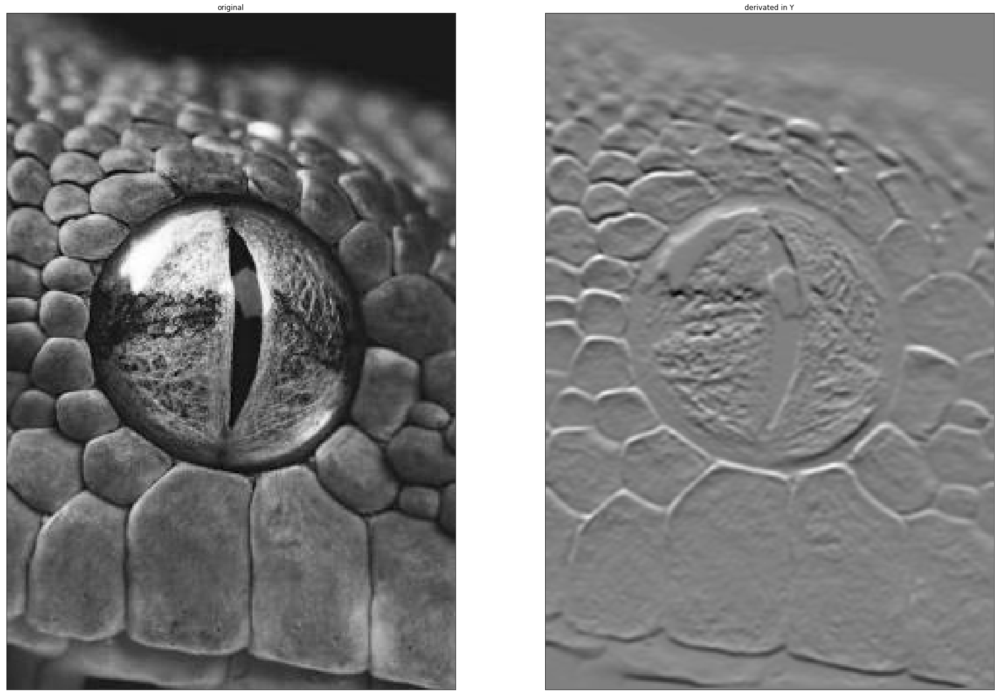

In [0]:
img = cv2.imread('ojo.jpg',0)
y_sobel = cv2.Sobel(img, cv2.CV_64F,0,1,ksize=5)

displayGray2(img, y_sobel, "original", "derivated in Y")

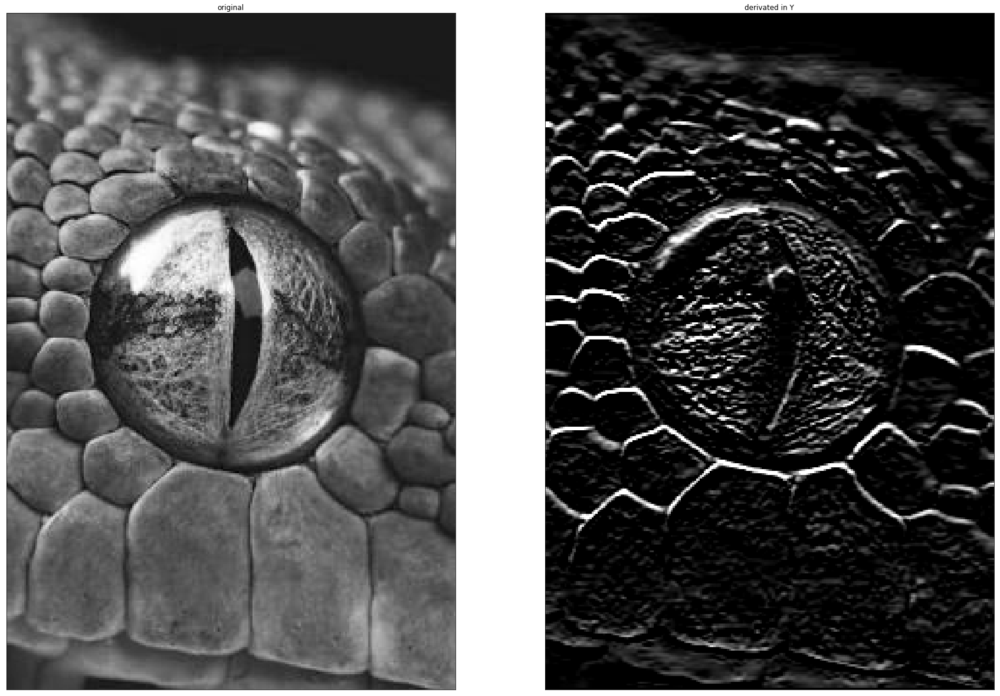

In [0]:
img4 = cv2.imread('ojo.jpg',0)

kernel = np.array([[-1,0,1],[-2,0,2],[-1,0,1]],np.float32) # en x
kernel2 = np.array([[-1,-2,-1],[0,0,0],[1,2,1]],np.float32) # en y

dst1 = cv2.filter2D(img4,-1,kernel2)

displayGray2(img4, dst1, "original", "derivated in Y")

# **Segmentacion (BGR)** 

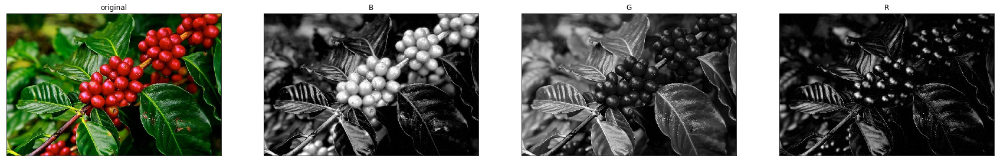

In [0]:
imgg = 'cafe.jpg'
img_BGR = cv2.imread(imgg,cv2.IMREAD_COLOR)
img_RGB_total = cv2.cvtColor(img_BGR,cv2.COLOR_BGR2RGB)

shifted = cv2.pyrMeanShiftFiltering(img_RGB_total, 21, 51) 

b,g,r = cv2.split(img_RGB_total)



displayGray4(img_RGB_total,b,g,r,'original','B','G','R')

# **Segmentación (LAB)**

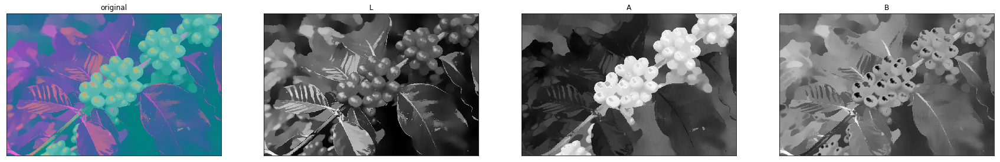

In [90]:
img_lab = 'cafe.jpg'
img_BGR = cv2.imread(img_lab,cv2.IMREAD_COLOR)

shifted = cv2.pyrMeanShiftFiltering(img_BGR, 21, 51) 
img_RGB_total = cv2.cvtColor(shifted,cv2.COLOR_BGR2LAB)


l,a,b = cv2.split(img_RGB_total)



displayGray4(img_RGB_total,l,a,b,'original','L','A','B')

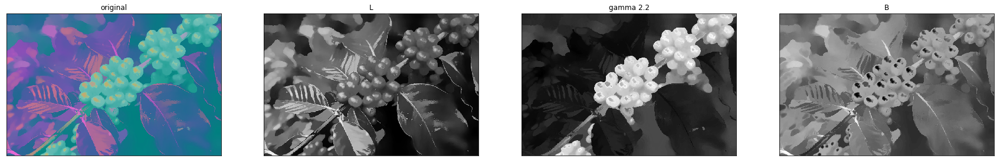

In [91]:


gamma_two_point_two = np.array(255*(a/255)**2.2,dtype='uint8')

displayGray4(img_RGB_total,l,gamma_two_point_two,b,'original','L','gamma 2.2','B')

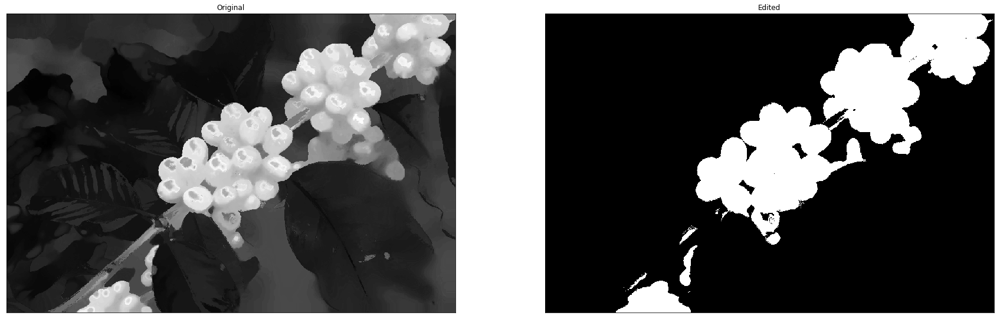

In [93]:

def Threshold(gamma_two_point_two,thres):
    #Cargar imagen    
    rows, columns = gamma_two_point_two.shape
    gamma_two_point_two2 = np.zeros( (rows, columns), dtype = np.uint8)
     
    #intervalos
    T = thres
 
    for x in range(0,rows):
        for y in range(0,columns):
            r = gamma_two_point_two[x][y]
            if T<=r:
                gamma_two_point_two2[x][y] = 255
            else:
                gamma_two_point_two2[x][y] = 0
                
   
    
    displayGray2(gamma_two_point_two,gamma_two_point_two2)
    return
  
sali = Threshold(gamma_two_point_two,90)


TypeError: ignored

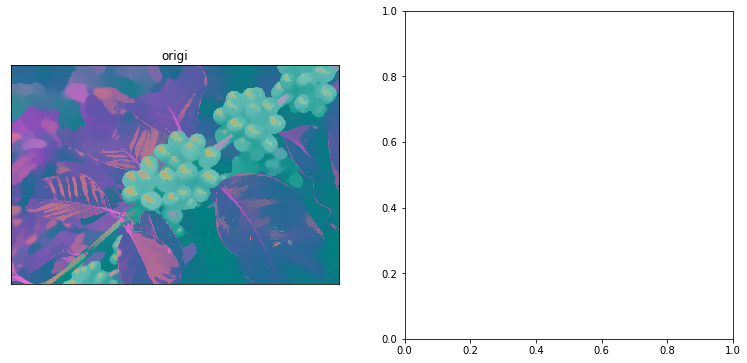

In [98]:
_, contours, _= cv2.findContours(image= sali, mode = cv2.RETR_EXTERNAL, method = cv2.CHAIN_APPROX_SIMPLE)
img_con = cv2.drawContours(image = img_RGB_total, contours = contours, contourIdx = -1, color = (0,0,255), thickness= 2)

contours2Filter=[]
contourok=[]

for idx, c in enumerate (contours):
  area=cv2.contourArea(c)
  if area <=30:
    contours2Filter.append(c)
  else :
    contourok.append(c)
M_R=cv2.drawContours(image=sali,contours=contours2Filter, contourIdx = -1, color = (0,0,0), thickness = -1)
displayGray3(img_RGB_total, sali, M_R, 'origi', 'thresh', 'M_R')




In [0]:
(x,y,w,h) = cv2.boundingRect(cntr[0])
cv2.rectangle(img_RGBCopyIII, (x,y), (x+w,y+h), (255, 0, 0), 2)
left,top,right,bottom= x,y,x+30,y+10
font = cv2.FONT_HERSHEY_SIMPLEX
font_size = 0.3
font_color = (255, 255, 255)
cv2.rectangle(img_RGBCopyIII,(left,top),(right,bottom),(125,125,125,0.8),-1,1)
cv2.rectangle(img_RGBCopyIII,(left,top+20),(right,bottom+20),(125,125,125,0.6),-1,1)
cv2.putText(img_RGBCopyIII,"Ripe",(left+3,top+12),font, font_size,font_color,1,cv2.LINE_AA)
cv2.putText(img_RGBCopyIII,str(80)+"%",(left+3,top+32),font,font_size,font_color,1,cv2.LINE_AA)


# Segmentación LAB **VERDE**

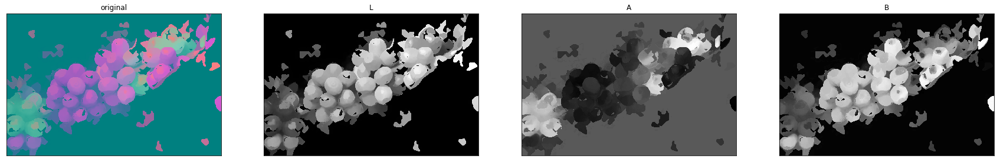

In [65]:
img_Verde = 'decafe.jpg'
img_lab = cv2.imread(img_Verde,cv2.IMREAD_COLOR)

shifted = cv2.pyrMeanShiftFiltering(img_lab, 21, 51) 
img_LAB_total = cv2.cvtColor(shifted,cv2.COLOR_BGR2LAB)


l,a,b = cv2.split(img_LAB_total)



displayGray4(img_LAB_total,l,a,b,'original','L','A','B')

# **Gamma Verde**

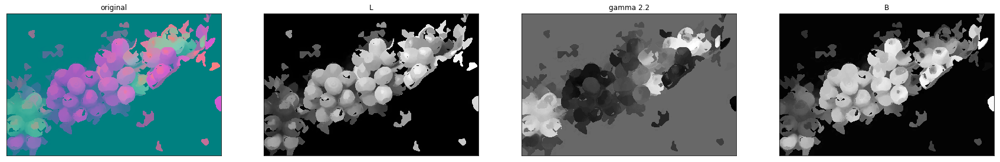

In [70]:
gamma_Verde = np.array(255*(a/255)**0.4,dtype='uint8')

displayGray4(img_LAB_total,l,gamma_Verde,b,'original','L','gamma 2.2','B')

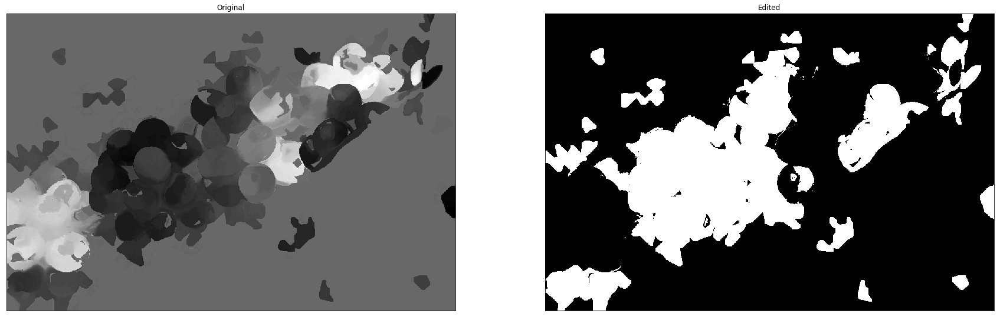

In [80]:
def Threshold(gamma_Verde,thres):
    #Cargar imagen    
    rows, columns = gamma_Verde.shape
    gamma_Verde1 = np.zeros( (rows, columns), dtype = np.uint8)
     
    #intervalos
    T = thres
 
    for x in range(0,rows):
        for y in range(0,columns):
            r = gamma_Verde[x][y]
            if T<=r:
                gamma_Verde1[x][y] = 0
            else:
                gamma_Verde1[x][y] = 255
                
   
    
    displayGray2(gamma_Verde,gamma_Verde1)
    return
  
Threshold(gamma_Verde,190)


# Segmentación RGB **VERDE**

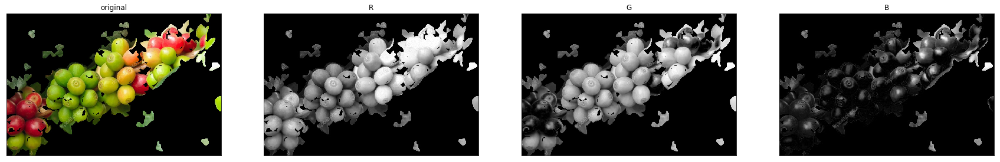

In [59]:
imgg = 'decafe.jpg'
img_BGR = cv2.imread(imgg,cv2.IMREAD_COLOR)
img_RGB_total = cv2.cvtColor(img_BGR,cv2.COLOR_BGR2RGB)

shifted = cv2.pyrMeanShiftFiltering(img_RGB_total, 21, 51) 

r,g,b = cv2.split(img_RGB_total)



displayGray4(img_RGB_total,r,g,b,'original','R','G','B')

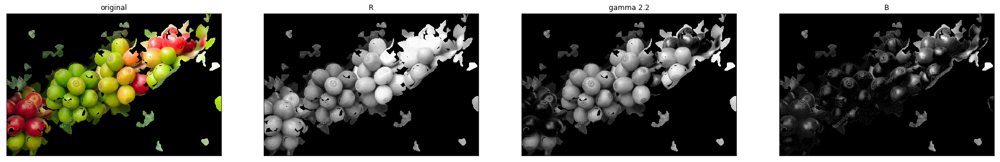

In [60]:
gamma_RGBerde = np.array(255*(g/255)**1.4,dtype='uint8')

displayGray4(img_RGB_total,r,gamma_RGBerde,b,'original','R','gamma 2.2','B')

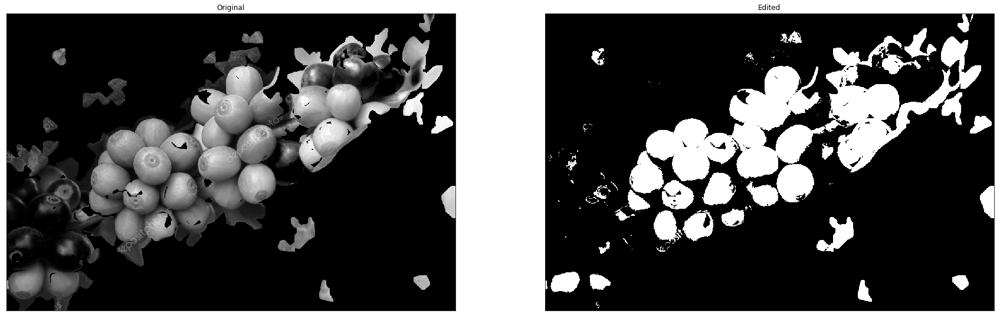

In [87]:
def Threshold(gamma_RGBerde,thres):
    #Cargar imagen    
    rows, columns = gamma_RGBerde.shape
    gamma_RGBerde1 = np.zeros( (rows, columns), dtype = np.uint8)
     
    #intervalos
    T = thres
 
    for x in range(0,rows):
        for y in range(0,columns):
            r = gamma_RGBerde[x][y]
            if T<=r:
                gamma_RGBerde1[x][y] = 255
            else:
                gamma_RGBerde1[x][y] = 0
                
   
    
    displayGray2(gamma_RGBerde,gamma_RGBerde1)
    return
  
Threshold(gamma_RGBerde,100)